# Исследование рынка заведений общественного питания в Москве.

Цель исследования: проанализировать рынок заведений общественного питания в Москве и дать рекомендацию фонду «...», какое заведение сейчас целесообразно открыть (тип заведения, количество посадочных мест и район расположения, ценовой диапозон). Отдельно заказчик просит проверить, целесообразно ли сейчас открывать новую кофейню в Москве.

Исследование включает следующиу шаги:
- Изучение данных по заведениям общественного питания в Москве и их предобработка;
- Анализ данных;
- Изучение целесообразности открытия кофейни;
- Выводы.

## Изучение данных и их предобработка

В нашем распоряжении есть следующие данные:

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

Импортируем необходимые библиотеки, загружаем данные в тетрадку.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import json
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Проверяем количество пропусков.

In [4]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

### Категория заведения

In [5]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

В наших данных нет пропусков категорий заведений, нет неявных дубликатов, тип данных менять не нужно.

### Район, где находится заведение

In [6]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Аналогичная ситуация с районом, где находится заведение: пропусков и неявных дубликатов нет, тип данных менять не нужно.

### Часы работы

В данных о часах работы есть пропуски, но их количество некритично (около 6%). Сгруппируем данные по району и типу заведения и попробуем найти закономерности.

In [7]:
df.groupby(['category', 'hours'])['name'].count()

category  hours                                            
бар,паб   вт-вс 12:00–00:00                                    1
          вт-вс 12:00–23:00                                    1
          вт-вс 14:00–22:00                                    1
          вт-вс 17:00–23:00                                    1
          вт-вс 19:00–06:00                                    1
                                                              ..
столовая  пн-чт 08:00–18:00; пт 08:00–17:00; сб 10:00–17:00    1
          пн-чт 08:30–18:00; пт 08:30–17:00                    1
          пн-чт 09:00–17:00; пт 09:00–16:00                    1
          пн-чт 09:00–18:00; пт 09:00–17:00                    2
          пн-чт 10:00–19:00; пт-вс 10:00–21:00                 1
Name: name, Length: 2037, dtype: int64

Получается, для 8 типов заведений у нас может быть более 2000 вариантов часов работы. Посмотрим, сколько типов часов работы для одного типа заведения, например, для баров и пабов.

In [8]:
df.loc[df['category'] == 'бар,паб'].groupby('hours')['name'].count()

hours
вт-вс 12:00–00:00                                       1
вт-вс 12:00–23:00                                       1
вт-вс 14:00–22:00                                       1
вт-вс 17:00–23:00                                       1
вт-вс 19:00–06:00                                       1
                                                       ..
ср,чт 12:00–23:00; пт,сб 12:00–01:00; вс 12:00–23:00    1
ср,чт 13:00–01:00; пт,сб 13:00–05:00; вс 13:00–03:00    1
ср-пт 15:00–00:00                                       1
чт 18:00–00:00; пт,сб 15:00–06:00; вс 15:00–00:00       1
чт-вс 20:00–06:00                                       1
Name: name, Length: 315, dtype: int64

Для одной категории у нас получается 315 типов рабочих часов. Исходя из этих данных, у нас не получится однозначно заполнить пропуски в столбце "часы работы", потому что у нас слишком много вариантов графика работы. В связи с этим заполним пропуски условным значением "неизвестно".

In [9]:
df['hours'] = df['hours'].fillna('неизвестно')
df['hours'].isna().sum()

0

### Рейтинг

In [10]:
df['rating'].sort_values().unique()

array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2,
       2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5,
       3.6, 3.7, 3.8, 3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8,
       4.9, 5. ])

В столбце рейтинг мы также не встречаем никаких аномалий: пропусков нет, значение рейтинга от 1 до 5.

### Категория цен

In [11]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Неявных дубликатов в данных нет, но зато есть достаточно много пропусков (более 50% строк не содержат информации о категории цен в заведении). Частично мы сможем заполнить пропуски на основании данных о среднем счёте и о цене чашки капучино, но большинство пропусков нам придётся заменить значением "неизвестно". Сделаем замену после анализа данных по среднему счёту и по цене одной чашки капучино.

### Цена заказа, средний счёт, средняя цена чашки капучино

Если изучать доступные данные, то у нас есть 3149 наблюдений среднего счёта и 535 наблюдений цены чашки капучино, хотя наблюдений цен заказа больше - 3816. Посмотрим, что это за цены.

In [12]:
df.loc[(df['middle_avg_bill'].isna() == True) & (df['middle_coffee_cup'].isna() == True)]['avg_bill'].unique()

array([nan, 'Цена бокала пива:250–350 ₽', 'Цена бокала пива:120–350 ₽',
       'Цена бокала пива:90–230 ₽', 'Цена бокала пива:160–499 ₽',
       'Цена бокала пива:199–300 ₽', 'Цена бокала пива:от 140 ₽',
       'Цена бокала пива:от 149 ₽', 'Цена бокала пива:150–450 ₽',
       'Цена бокала пива:130–150 ₽', 'Цена бокала пива:220–350 ₽',
       'Цена бокала пива:180–330 ₽', 'Цена бокала пива:220–550 ₽',
       'Цена бокала пива:150–290 ₽', 'Цена бокала пива:320–440 ₽',
       'Цена бокала пива:370–410 ₽', 'Цена бокала пива:320–460 ₽',
       'Цена бокала пива:180–420 ₽', 'Цена бокала пива:280 ₽',
       'Цена бокала пива:150–350 ₽', 'Цена бокала пива:270–390 ₽',
       'Цена бокала пива:200–440 ₽', 'Цена бокала пива:380–400 ₽',
       'Цена бокала пива:260–380 ₽', 'Цена бокала пива:200–300 ₽',
       'Цена бокала пива:от 350 ₽', 'Цена бокала пива:от 200 ₽',
       'Цена бокала пива:100–250 ₽', 'Цена бокала пива:от 195 ₽',
       'Цена бокала пива:240–380 ₽', 'Цена бокала пива:160–350 ₽',


In [13]:
df.loc[(df['price'].isna()) & (df['avg_bill'].str.find('Цена бокала пива') >= 0)]['avg_bill'].count()
#смотрим, сколько есть наблюдений, где в строке средний чек стоит цена бокала пива, а уровень цен не заполнен


16

In [15]:
df.loc[(df['price'].isna()) & (df['avg_bill'].str.find('Цена бокала пива') >= 0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
418,Эллилагер,"бар,паб","Москва, улица Ляпидевского, 22",Северный административный округ,"ежедневно, 12:00–00:00",55.859396,37.493267,4.7,NaN,Цена бокала пива:от 140 ₽,NaN,NaN,0,NaN
1478,Harat’s pub,"бар,паб","Москва, улица Авиаконструктора Микояна, 12",Северный административный округ,"ежедневно, 12:00–06:00",55.792328,37.527339,4.3,NaN,Цена бокала пива:320–440 ₽,NaN,NaN,0,30.0
1716,Библиотека бар,"бар,паб","Москва, Бутырская улица, 67, стр. 1",Северный административный округ,"ежедневно, 12:00–00:00",55.802189,37.582823,4.2,NaN,Цена бокала пива:150–350 ₽,NaN,NaN,0,98.0
1876,Злачное место,"бар,паб","Москва, улица Руставели, 15",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.813632,37.597587,4.3,NaN,Цена бокала пива:260–380 ₽,NaN,NaN,0,35.0
1918,Бар Wild Tony,"бар,паб","Москва, Ленинградский проспект, 47, стр. 13",Северный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 14:00...",55.799769,37.531952,4.4,NaN,Цена бокала пива:200–300 ₽,NaN,NaN,0,NaN
2220,Гастробар Острог,"бар,паб","Москва, проспект Мира, 97",Северо-Восточный административный округ,пн-чт 09:00–00:00; пт 09:00–02:00; сб 12:00–02...,55.809933,37.635954,4.7,NaN,Цена бокала пива:240–380 ₽,NaN,NaN,0,143.0
2351,4.2. Bar,"бар,паб","Москва, улица Академика Королёва, 4, корп. 2",Северо-Восточный административный округ,пн-чт 11:00–01:00; пт-вс 11:00–03:00,55.822559,37.626814,4.5,NaN,Цена бокала пива:300 ₽,NaN,NaN,0,100.0
2848,Рестобар,"бар,паб","Москва, Семёновская площадь, 7, корп. 17",Восточный административный округ,пн-ср 12:00–00:00; чт 12:00–03:00; пт 11:00–00...,55.783886,37.721900,4.3,NaN,Цена бокала пива:200–350 ₽,NaN,NaN,0,46.0
3443,We Cidreria,"бар,паб","Москва, Благовещенский переулок, 5",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.767914,37.598546,4.9,NaN,Цена бокала пива:370–420 ₽,NaN,NaN,1,60.0
4024,Слепой Пью,"бар,паб","Москва, улица Арбат, 30/3с1",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.749200,37.590120,4.5,NaN,Цена бокала пива:250–490 ₽,NaN,NaN,0,NaN


Всего у нас присутствует 16 таких наблюдений. Мы могли бы заполнить пропуски в столбце с уровнем цен (например, вручную), но встаёт вопрос, насколько это целесообразно. Заполнение 16 пропусков не сильно повлияет на общее количество значений в столбце price (менее, чем на 0.5%), поэтому мы можем себе позволить не заполнять эти пропуски.

Теперь посмотрим данные по цене чашки капучино.

In [16]:
df.pivot_table(index='price',columns='category',values='middle_coffee_cup', aggfunc=['min','median','max'])

min                   median                      max  \
category      бар,паб кофейня пиццерия бар,паб кофейня пиццерия бар,паб   
price                                                                     
высокие         250.0     NaN      NaN   250.0     NaN      NaN   250.0   
выше среднего     NaN   256.0    150.0     NaN   256.0    150.0     NaN   
низкие            NaN    60.0      NaN     NaN   139.0      NaN     NaN   
средние         170.0    60.0    150.0   195.0   200.0    155.0   250.0   

                                
category      кофейня пиццерия  
price                           
высокие           NaN      NaN  
выше среднего   256.0    150.0  
низкие          256.0      NaN  
средние        1568.0    160.0

In [17]:
df.loc[(df['price'].isna()) & (df['avg_bill'].str.find('капучино') >= 0)]['avg_bill'].count()

257

Так как кофейни представляют повышенный интерес для нашего исследования, мы могли бы заполнить эти 257 пропусков в столбце price, но встаёт вопрос, насколько это будет корректно. Так как у нас нет данных о пороговых значениях, лучше воздержаться от заполнений, но при этом обратить внимание инженеров данных на эту ситуацию.

Теперь изучим средний счёт.

In [18]:
df.pivot_table(index='price',columns='category',values='middle_avg_bill', aggfunc=['median'])

median                                                    \
category      бар,паб булочная быстрое питание    кафе кофейня пиццерия   
price                                                                     
высокие        2000.0   2500.0          3200.0  2000.0  2000.0   1900.0   
выше среднего  1250.0   1225.0          1250.0  1250.0  1250.0   1250.0   
низкие          170.0    150.0           150.0   150.0   145.5    225.0   
средние         850.0    442.5           400.0   500.0   400.0    670.0   

                                 
category      ресторан столовая  
price                            
высокие         2250.0   3750.0  
выше среднего   1250.0   1225.0  
низкие           300.0    212.5  
средние          700.0    300.0

In [19]:
df.loc[(df['price'].isna()) & (df['avg_bill'].str.find('Средний') >= 0)]['avg_bill'].count()

470

По данным среднего чека мы могли бы заполнить уровень цен для 470 наблюдений, но мы опять же не будем этого делать по причинам, аналогичным цене чашки капучино.

Чтобы было удобнее работать с данными, заполним пропуски для столбца уровень цен условным значением "неизвестно". Аналогично заполним пропуски для средней стоимости заказа. Пропуски в столбцах "средний счёт" и "цена чашки капучино" заполним условным значением -1 (в дальнейшем такие данные будем исключать из анализа).

In [20]:
df['price'] = df['price'].fillna('неизвестно')
df['avg_bill'] = df['avg_bill'].fillna('неизвестно')
df['middle_avg_bill'] = df['middle_avg_bill'].fillna(-1)
df['middle_coffee_cup'] = df['middle_coffee_cup'].fillna(-1)
df.isna().sum() 

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill         0
middle_coffee_cup       0
chain                   0
seats                3611
dtype: int64

### Количество посадочных мест

В наших данных достаточно много пропусков (около 43% от общего числа наблюдений).

In [21]:
df.pivot_table(index='category', columns='district', values='seats', aggfunc='median')

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",95.5,96.5,70.0,66.0,85.0,90.0,55.0,63.0,80.0
булочная,36.0,90.0,35.0,98.0,45.5,50.0,77.0,50.0,30.0
быстрое питание,40.0,100.0,51.5,60.0,80.0,94.5,50.0,75.0,83.0
кафе,48.0,66.0,50.0,60.0,95.0,84.0,58.0,70.0,45.0
кофейня,55.0,96.0,66.0,75.0,87.5,86.0,50.0,64.5,80.0
пиццерия,42.5,70.0,55.0,70.0,57.5,90.0,45.0,48.0,45.0
ресторан,60.0,100.0,80.0,80.0,92.0,100.0,70.0,70.0,95.0
столовая,72.0,47.0,50.0,48.0,60.0,100.0,95.0,68.0,80.0


Мы могли бы заполнить пропуски медианным значением по типу заведения и району, но лучше этого не делать, чтобы не искажать данные. Заполним пропуски условным значением -1, в дальнейшем будем исключючать такие наблюдения из анализа.

In [22]:
df['seats'] = df['seats'].fillna(-1)
df.isna().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

Если обратить внимание на таблицу с медианными значениями, то мы увидим, что некоторые значения не являются целым числом, что ошибочно (не может быть полтора посадочных места). Изменим тип seats с float на int.

In [23]:
df['seats'] = df['seats'].astype('int')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   float64
 11  middle_coffee_cup  8406 non-null   float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 919.5+ KB


### Сетевые заведения

В описании к данным сказано, что несетевые заведения могут быть отмечены, как сетевые (что неверно).

In [24]:
#смотрим сетевые заведения
df.loc[df['chain'] == 1]['name'].value_counts()

Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Яндекс Лавка         69
                   ... 
BigСуши               1
Суши Wok              1
Рома                  1
В своей тарелке       1
Донер хаус            1
Name: name, Length: 762, dtype: int64

Действительно, есть названия, которые встречаются в данных только 1 раз, при этом заведение помечено как сетевое. Определим, сколько таких заведений.

In [25]:
df.loc[df['chain'] == 1]['name'].value_counts().loc[lambda x : x == 1]

Чабан Чуду         1
Ливан Хаус         1
Шашлыки            1
Пицца экспресс     1
Дайнинг Холл       1
                  ..
BigСуши            1
Суши Wok           1
Рома               1
В своей тарелке    1
Донер хаус         1
Name: name, Length: 64, dtype: int64

Таких заведений всего лишь 64 (это менее 1 % данных). Мы можем не исправлять данные вручную, так как ошибка не должна повлиять на общий результат исследования.

In [26]:
#смотрим несетевые заведения
df.loc[df['chain'] == 0]['name'].value_counts()

Кафе                   189
Шаурма                  43
Ресторан                34
Столовая                28
Бистро                  12
                      ... 
Lavaш                    1
ClubPizza                1
Karma Coffee             1
Steel bar & kitchen      1
Четвёртая стена          1
Name: name, Length: 4852, dtype: int64

In [27]:
df.loc[df['chain'] == 0]['name'].value_counts().loc[lambda x : x > 1]

Кафе                 189
Шаурма                43
Ресторан              34
Столовая              28
Бистро                12
Кофейня               12
Кафе-столовая          9
Буфет                  8
Трапезная              7
Шашлычная              6
Поминальные обеды      5
Пиццерия               3
Блины                  3
Кафе-кулинария         2
Чебуречная             2
Кафе для поминок       2
Name: name, dtype: int64

Судя по названиям, при подготовке данных были допущены ошибки (тип заведения был внесён вместо названия). Исправить это на основе имеющихся данных не представляется возможным, поэтому будем считать, что заведения из списка выше всё-таки несетевые.

### Создание столбца с названиями улиц

In [28]:
#создаём функцию, которая разбивает строку с адресом по запятой и возвращает второй элемент (улицу)
def address(text, sep=', '):
    name = text.split(sep=sep)
    return name[1]

In [29]:
#создаём столбец с названием улицы
df['street'] = df['address'].apply(address)
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,неизвестно,-1.0,-1.0,0,-1,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,Правобережная улица


### Создание столбца с обозначением, работает ли заведение круглосуточно

In [30]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,неизвестно,-1.0,-1.0,0,-1,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,неизвестно,-1.0,-1.0,0,-1,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,-1.0,0,45,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,-1.0,0,45,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,-1.0,0,79,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,-1.0,0,65,Ангарская улица,False


### Устранение дубликатов.

In [31]:
df.duplicated().sum()

0

Явных дубликатов нет. Проверим, есть ли неявные дубликаты. Чтобы не вносить изменения в изначальные данные, создадим новые столбцы: название заведения, написанное с маленькой буквы, и адрес, написанный с маленькой буквы. Мы не можем использовать только название улицы, потому что на одной улице может быть несколько заведений с одинаковым названием (например, какая-нибудь сетевая кофейня на длинном проспекте). Также в названиях заведений заменим "ё" на "е".

In [32]:
df['name_1'] = df['name'].str.lower()
df['name_1'] = df['name_1'].str.replace('ё', 'е')
df['address_1'] = df['address'].str.lower()
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,name_1,address_1
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,неизвестно,-1.0,-1.0,0,-1,улица Дыбенко,False,wowфли,"москва, улица дыбенко, 7/1"
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица Дыбенко,False,четыре комнаты,"москва, улица дыбенко, 36, корп. 1"
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,Клязьминская улица,False,хазри,"москва, клязьминская улица, 15"
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1,улица Маршала Федоренко,False,dormouse coffee shop,"москва, улица маршала федоренко, 12"
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,Правобережная улица,False,иль марко,"москва, правобережная улица, 1б"


In [33]:
df[['name_1', 'address_1']].duplicated().sum()

4

In [34]:
#ищем индексы строк-дубликатов
df_del = df.loc[df[['name_1', 'address_1']].duplicated() == True].index
df_del

Int64Index([215, 1511, 2420, 3109], dtype='int64')

In [35]:
#удаляем неявные дубликаты
df = df.drop(labels = df_del, axis = 0).reset_index(drop=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8402 entries, 0 to 8401
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              8402 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              8402 non-null   object 
 9   avg_bill           8402 non-null   object 
 10  middle_avg_bill    8402 non-null   float64
 11  middle_coffee_cup  8402 non-null   float64
 12  chain              8402 non-null   int64  
 13  seats              8402 non-null   int64  
 14  street             8402 non-null   object 
 15  is_24/7            8402 non-null   bool   
 16  name_1             8402 

Неявные дубликаты были удалены.

### Вывод

В рамках этого раздела мы изучили имеющиеся у нас данные, заполнили пропуски условными значениями, удалили неявные дубликаты, создали новые столбцы. Таким образом, данные готовы для анализа.

## Анализ данных

### Распеределение заведений по категориям

In [36]:
df.groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: name, dtype: int64

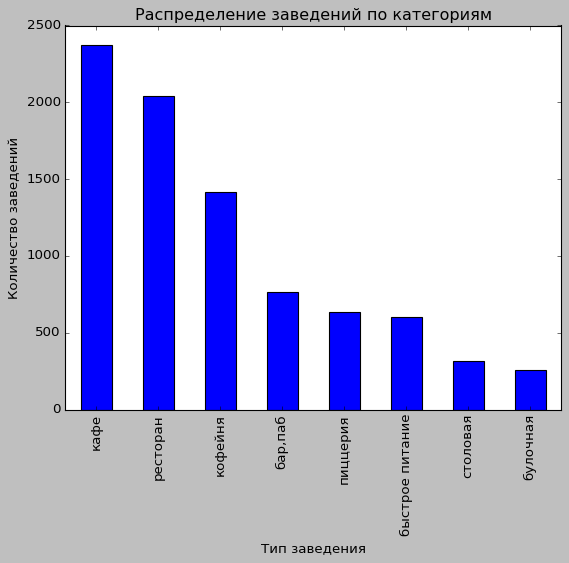

In [37]:
plt.style.use('classic')
df.groupby('category')['name'].count().sort_values(ascending=False).plot.bar()
plt.title('Распределение заведений по категориям')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.show()

Самые популярные категории заведений в Москве: кафе и рестораны (более 2000 заведений по обоим типам). На третьем месте кофейни (1413 заведений). Самые непопулярные категории - булочные и столовые (менее 315 заведений).

### Количество посадочных мест в зависимости от категории

In [38]:
df.loc[df['seats'] > 0].pivot_table(index='category', values='seats', aggfunc='median')

,seats
category,
"бар,паб",84
булочная,52
быстрое питание,75
кафе,60
кофейня,80
пиццерия,56
ресторан,90
столовая,80


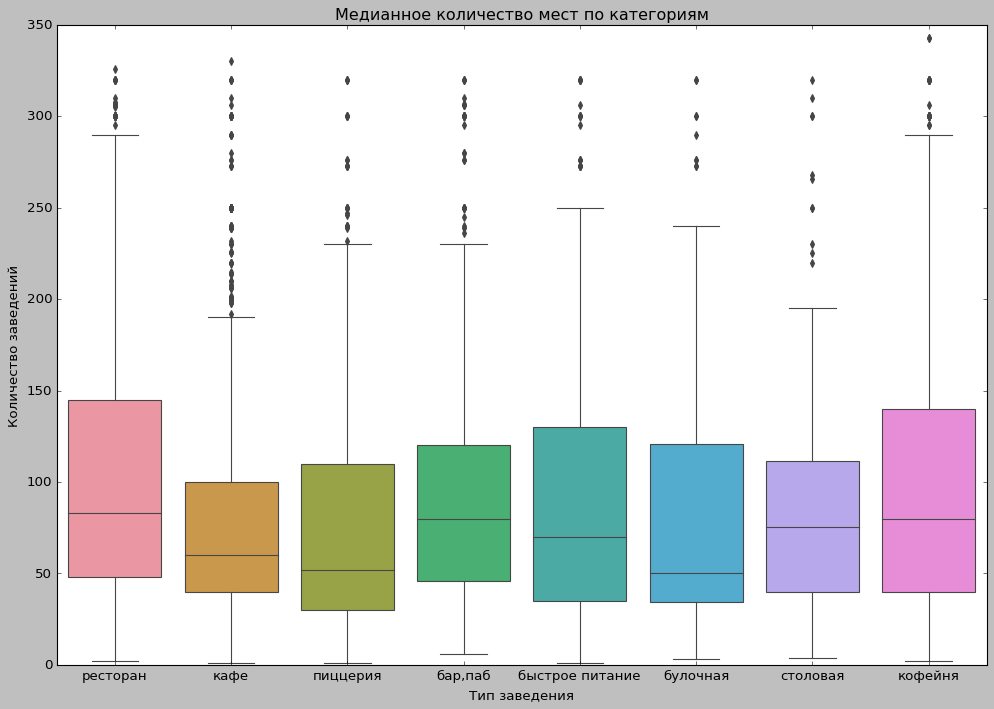

In [39]:
plt.style.use('classic')
plt.figure(figsize =(15, 10))
sns.boxplot(x='category', y='seats', data=df.loc[(df['seats'] > 0) & (df['seats'] < 350)])
#поставим ограничение не более 350 посадочных мест для большей наглядности графика
plt.title('Медианное количество мест по категориям')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.show()

Для анализа мы возьмём медианное значение количества мест в заведении (если будем использовать средние данные, оценка может получиться смещённой из-за очень маленьких и очень больших заведений).
Больше всего посадочных мест в барах/пабах и ресторанах (84 и более), меньше всего в пиццериях и булочных (56 и менее). Медианное значение для кофеен - 80.
Существуют отдельные выбросы (более 350 посадочных мест), но теоретически это возможно, например, большие большие банкетные залы и заведения с большими верандами.

### Cоотношение сетевых и несетевых заведений

In [40]:
df.groupby('chain')['name'].count()

chain
0    5199
1    3203
Name: name, dtype: int64

Для наглядности визуализации создадим новый столбец ch, где вместо 0 и 1 добавим значения "сетевое" и "несетевое".

In [41]:
df['ch'] = df['chain']
df['ch'] = df.loc[df['chain'] == 0]['ch'].replace(0, 'несетевое')
df['ch'] = df['ch'].fillna('сетевое')
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,name_1,address_1,ch
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,неизвестно,-1.0,-1.0,0,-1,улица Дыбенко,False,wowфли,"москва, улица дыбенко, 7/1",несетевое
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица Дыбенко,False,четыре комнаты,"москва, улица дыбенко, 36, корп. 1",несетевое
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,Клязьминская улица,False,хазри,"москва, клязьминская улица, 15",несетевое
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1,улица Маршала Федоренко,False,dormouse coffee shop,"москва, улица маршала федоренко, 12",несетевое
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,Правобережная улица,False,иль марко,"москва, правобережная улица, 1б",сетевое


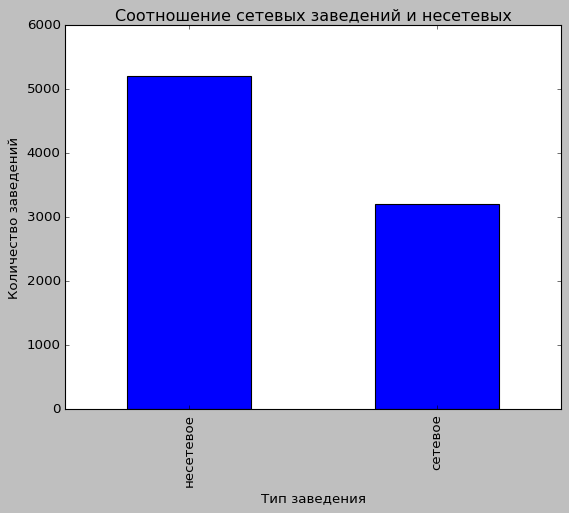

In [42]:
plt.style.use('classic')
df.groupby('ch')['name'].count().plot.bar()
plt.title('Соотношение сетевых заведений и несетевых')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.show()

Сетевые заведения составляют примерно 38% общего числа заведений. С одной стороны, количество сетевых заведений меньше, чем несетевых (примерно в 1,6 раз), с другой стороны доля сетевых заведений является существенной.

### Соотношение сетевых и несетевых заведений в зависимости от типа

In [43]:
df.pivot_table(index='category', columns='ch', values='name', aggfunc='count')

ch,несетевое,сетевое
category,,
"бар,паб",596,168
булочная,99,157
быстрое питание,371,232
кафе,1597,779
кофейня,693,720
пиццерия,303,330
ресторан,1313,729
столовая,227,88


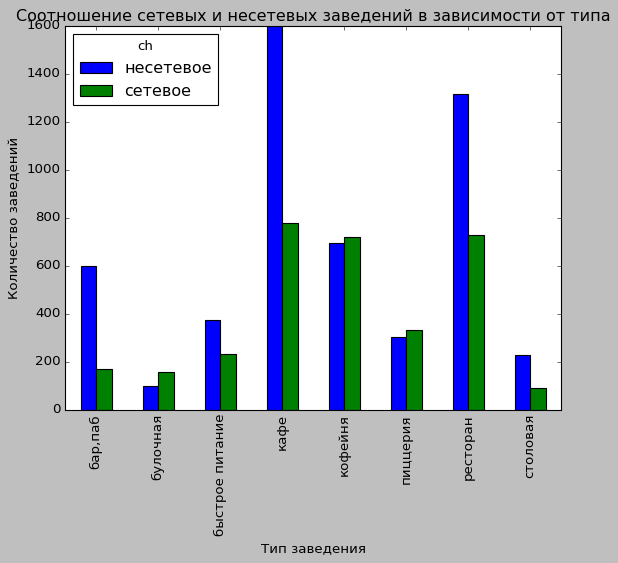

In [44]:
plt.style.use('classic')
df.pivot_table(index='category', columns='ch', values='name', aggfunc='count').plot.bar()
plt.title('Соотношение сетевых и несетевых заведений в зависимости от типа')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.show()

Чаще всего сетевыми являются кафе, кофейни и рестораны, реже всего столовые. При этом следует обратить внимание, что в категориях кафе и рестораны несетевых заведений больше примерно в два раза, что касается кофеен, то количество примерно одинавковое (сетевых чуть больше). Распределение по пиццериям такое же, как по кофейнях (в разрезе сетевая/несетевая), булочные гораздо чаще сетевые. Столовые, заведения быстрого питания и пабы/бары гораздо чаще несетевые (аналогично ресторанам и кафе).

### ТОП-15 сетевых заведений Москвы

In [45]:
#определяем список ТОП-15 сетевых заведений
df.loc[df['chain'] == 1]['name'].value_counts().head(15)

Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Name: name, dtype: int64

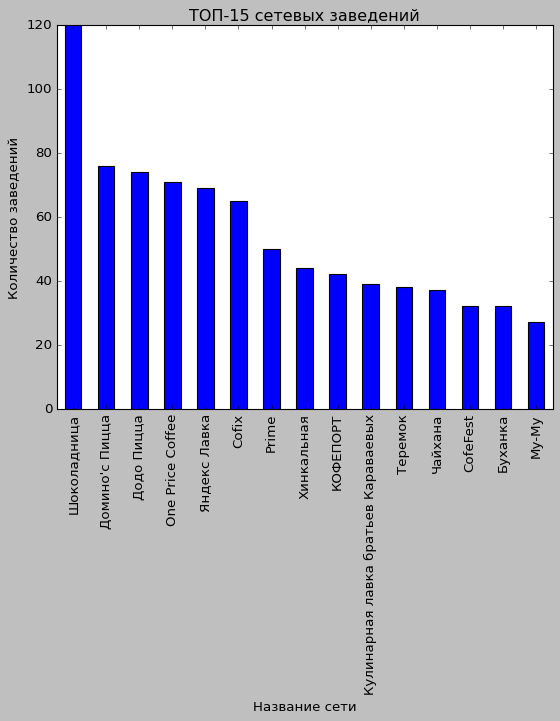

In [46]:
plt.style.use('classic')
df.loc[df['chain'] == 1]['name'].value_counts().head(15).plot.bar()
plt.title('ТОП-15 сетевых заведений')
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.show()

In [47]:
top15 = df.loc[df['chain'] == 1]['name'].value_counts().head(15).index
top15

Index(['Шоколадница', 'Домино'с Пицца', 'Додо Пицца', 'One Price Coffee',
       'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ',
       'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'CofeFest',
       'Буханка', 'Му-Му'],
      dtype='object')

In [48]:
df_top = df[df['name'].isin(top15)]
df_top[['name', 'category']]

,name,category
13,Буханка,булочная
23,Буханка,булочная
32,Додо Пицца,пиццерия
34,Домино'с Пицца,пиццерия
46,CofeFest,кофейня
...,...,...
7969,Теремок,ресторан
7970,Хинкальная,ресторан
7975,Яндекс Лавка,ресторан
7976,Яндекс Лавка,ресторан


In [49]:
df_top['category'].value_counts()

кофейня            336
ресторан           186
пиццерия           151
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: category, dtype: int64

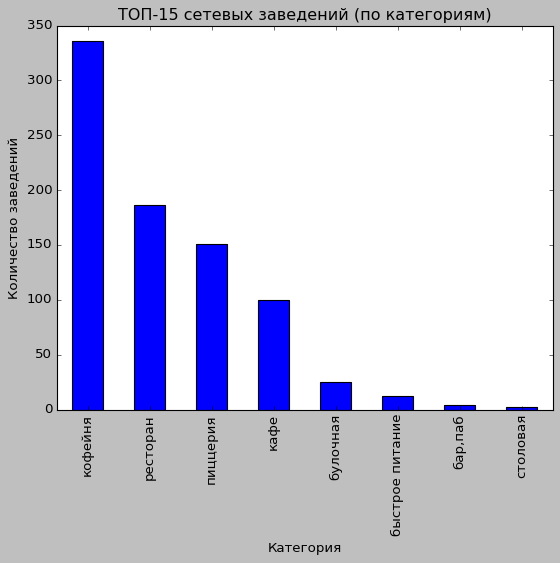

In [50]:
df_top['category'].value_counts().plot.bar()
plt.title('ТОП-15 сетевых заведений (по категориям)')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

Больше всего в ТОП-15 заведений Москвы представлено сетевых кофеен (336), за ними с большим отрывом идут сетевые рестораны, пиццерии и кафе. Вызывает удивление, что в наших данных только две сетевых столовых, попробуем разобраться, с чем это связано.

In [51]:
df_top.loc[df_top['category'] == 'столовая']['name']

2290    Хинкальная
4806         Му-Му
Name: name, dtype: object

In [52]:
#проверяем тип заведения "Му-Му"
df_top.loc[df_top['name'] == 'Му-Му']['category']

80                 кафе
361                кафе
1716           ресторан
1856            кофейня
2168    быстрое питание
2644               кафе
2728           ресторан
2877               кафе
3409    быстрое питание
3660               кафе
3668               кафе
3721               кафе
3951           пиццерия
3981           ресторан
4590            кофейня
4702           ресторан
4717           ресторан
4806           столовая
4823               кафе
4905           ресторан
5100               кафе
5153               кафе
5309            бар,паб
5991               кафе
6548           ресторан
6878           ресторан
7746               кафе
Name: category, dtype: object

Как видно из данных выше, заведение с одним названием может относиться к разным типам (что, скорее всего, неверно). Нужно обратить внимание инженеров данных на этот момент.

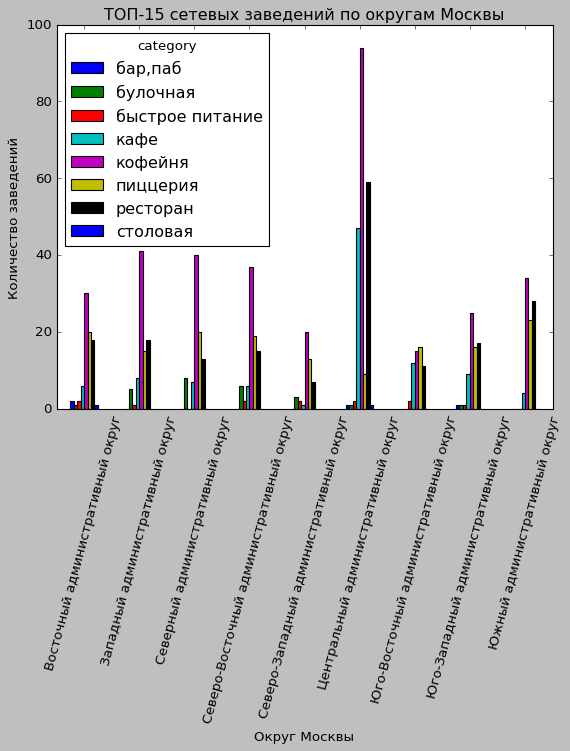

In [53]:
df_top.pivot_table(index='district', columns='category', values='name', aggfunc='count').plot.bar()
plt.title('ТОП-15 сетевых заведений по округам Москвы')
plt.xticks(rotation=75)
plt.xlabel('Округ Москвы')
plt.ylabel('Количество заведений')
plt.show()

Изучим полученный график. Больше всего сетевых кофеен находится в центре, далее следуют ЗАО, САО, СВАО, ЮАО. Меньше всего сетевых кофеен в ЮВАО (там находится промзона, вероятно формат кофеен там не очень востребован). Ресторанов тоже больше всего в центре, а меньше всего на северо-западе. Кафе тоже больше всего в центре, а вторым по популярности округом является юго-воточный. Ещё бросается в глаза, что сетевые пиццерии распространены более-менее равномерно по всей Москве, но при этом меньше всего пиццерий как раз в центре (скорее всего, люди, выезжающие в центр погулять, не выбирают фаст-фуд в качестве обеда или ужина, потому что могут посетить подобное заведение в своём районе).

### Количество заведений по категории и районам

In [54]:
df.pivot_table(index='district', columns='category', values='name', aggfunc='count')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,234,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


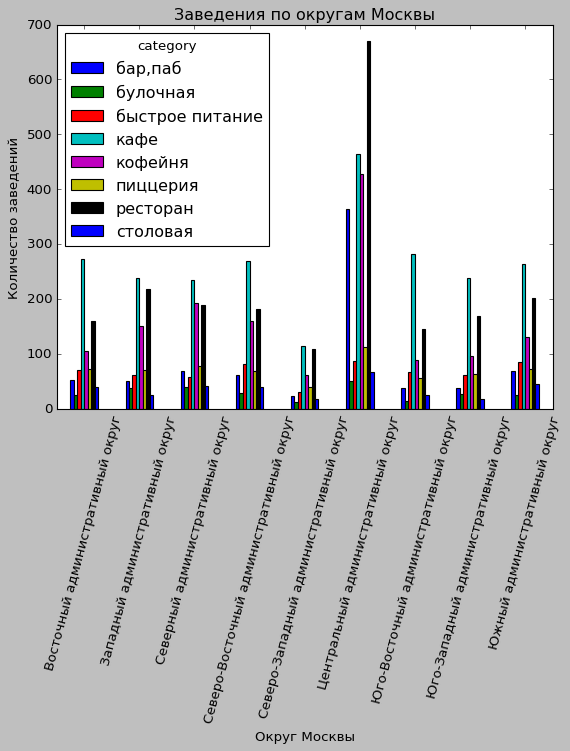

In [55]:
df.pivot_table(index='district', columns='category', values='name', aggfunc='count').plot.bar()
plt.title('Заведения по округам Москвы')
plt.xticks(rotation=75)
plt.xlabel('Округ Москвы')
plt.ylabel('Количество заведений')
plt.show()

Рекордсменом по количеству заведений является Центральный административный округ, что не противоречит нашим ожиданиям. Центр Москвы - место притяжения туристов, здесь расположены исторические объекты и популярные места для прогулок как местных жителей, так и гостей столицы. Также в центре расположено множество офисов и большинство вокзалов, из-за чего в центре всегда много людей. Также ни для кого не секрет, что в центре Москвы кипит наиболее активняа ночная жизнь.

Меньше всего заведений расположено в СЗАО, что также не удивительно (здесь самая низкая плотность населения в столице).

Теперь рассмотрим каждую категорию в отдельности:

- Бары и пабы расположены преимущественно в центре, в остальных округах их минимум в 5 раз меньше. Как говорили ранее, в центре наиболее активная ночная жизнь, а бары и пабы чаще всего посещают либо вечером после работы (а офисы часто в центре), либо по вечерам в выходные. Люди реже посещают пабы в своём районе рядом с домом. Если человек не хочет ехать в центр, он может выпить с друзьями дома. Если смотреть другие районы, то баров больше всего на сесере и юге, меньше всего на северо-западе, юго-востоке, юго-западе.

- Булочные распределены более-менее однородно по городу, хотя если смотреть абсолютные значение, то больше всего их также в центре. Особенность их распространения можно объяснить следующим образом: в булочной можно взять быстрый завтрак или купить хлеб вечером по дороге домой, поэтому клиенты булочных живут обычно неподалёку. Редко бывает так, что человек покупает выпечку в центре города, а потом едет к себе домой на окраину. Булочные не очень популярный тип заведений в Москве.

- Заведения быстрого питания также распространены в Москве более-менее равномерно (хотя по абсолютным значениям центр опять в лидерах). Часто заведения быстрого питания расположены в торговых центрах, на вокзалах (авто и ж\д), на крупных трассах. Люди редко идут сюда целенаправленно, но здесь удобно перекусить по дороге в кино, после покупок или в ожидании поезда.

- Кафе больше всего распространены в центре, менее всего в СЗАО, по другим районам они распространены более-менее равномерно (встречаются примерно в полтора раза реже, чем в центре). Формат кафе популярен у офисных сотрудников (бизнес-ланч во время обеденного перерыва), а также у людей живущих неподалёку (формат завтрака, ужина, а также вариант для похода на свидание).

- Кофейни - это достаточно специфический формат заведения. Часто предполагается, что люди берут кофе и идут дальше, поэтому кофейни должны быть распространены там, где большой поток людей (центр города, где люди часто гуляют; транспортные узлы - старнии метро, автовоказалы, ж/д-вокзалы, где большой людской поток; торговые центры, где кофе выступает в качестве альтернативы заведениям быстрого питания). Поэтому ничего удивительного нет в том, что больше всего кофеен в центре, а по остальным районам (кроме СЗАО с низкой застройкой и относительно невысокой деловой активностью) они распространены более менее равномерно (минимум в 2 раза реже, чем в центре), при этом кофеен больше на западе и севере, чем на юге и востоке.

- Пиццерии во многом повторяют тенденции, прослеживающиеся в заведениях быстрого питания. Сетевые пиццерии часто относят к заведениям быстрого питания (поэтому похожий формат и места расположения), дорогие пиццерии, стилизованные под итальянские заведения, часто расположены в центре (аналогично другим ресторанам, которые мы обсудим далее).

- Рестораны расположены преимущественно в центре города, в других районах ресторанов меньше как минимум в 3 раза. С одной стороны ресторан - это вариант досуга вечером или в выходной день (аналогично бару), с другой стороны много ресторанов в туристических местах (где люди любят гулять). Рестораны в среднем дороже, чем кафе, поэтому большинство не посещает их каждый день.

- Столовые также являются не очень популярным форматом заведений в Москве (как и булочные). Больше всего столовых в центре. Если смотреть по остальным районам, то на востоке Москвы их больше, чем на западе.

### Зависимость среднего рейтинга от категории заведения

In [56]:
df.pivot_table(index='category', values='rating', aggfunc='mean')

,rating
category,
"бар,паб",4.387696
булочная,4.268359
быстрое питание,4.050249
кафе,4.124285
кофейня,4.277282
пиццерия,4.301264
ресторан,4.290402
столовая,4.211429


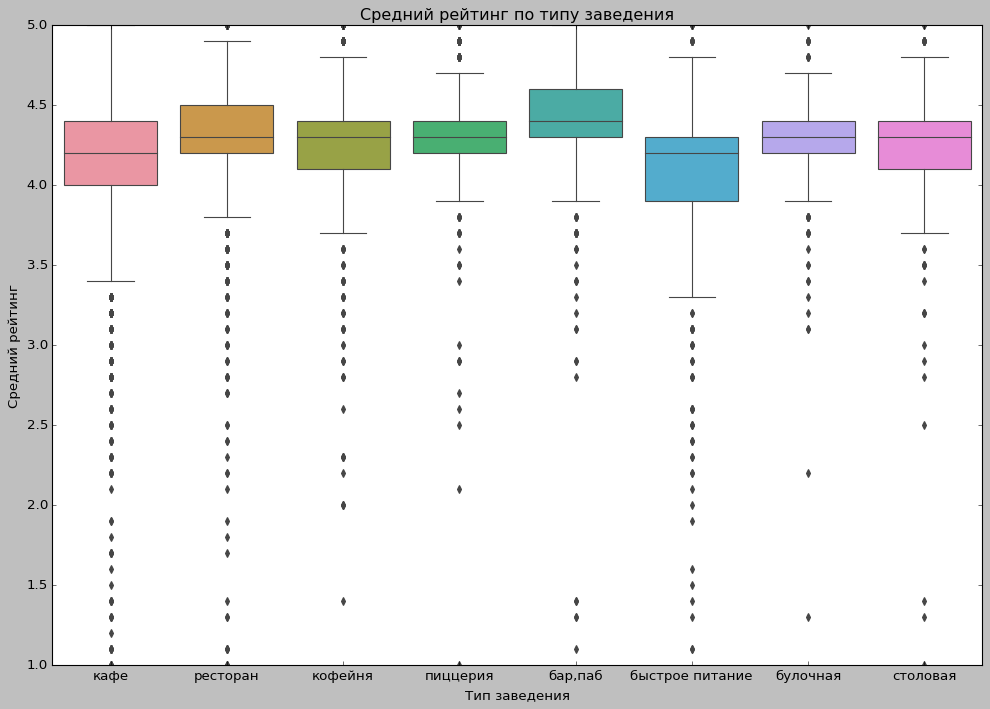

In [57]:
plt.figure(figsize =(15, 10))
sns.boxplot(x='category', y='rating', data=df)
plt.title('Средний рейтинг по типу заведения')
plt.xlabel('Тип заведения')
plt.ylabel('Средний рейтинг')
plt.show()

Средний рейтинг по типу заведения различается незначительно и колеблится в диапозоне от 4.05 (заведения быстрого питания) до 4.39 (бары и пабы).

### Фоновая картограмма со средним рейтингом заведений каждого района

In [58]:
state_geo = '/datasets/admin_level_geomap.geojson'
m_lat, m_lng = 55.751244, 37.618423
m1 = folium.Map(location=[m_lat, m_lng], zoom_start=10)
folium.Choropleth(
    geo_data = state_geo,
    data = df,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний рейтинг заведений по районам'
).add_to(m1)

m1

Как видно из фоновой картограммы, самый высокий средний рейтинг заведений в северо-восточном административном округе (более 4.7), самый низкий в восточном (менее, чем 3.6). Средний ретинг заведений в центре Москвы - около 4.

### Все заведения на карте Москвы

In [59]:
#функция для создания кластеров
def create_clusters(row):
    folium.Marker([row['lat'], row['lng']], popup = f"{row['name']}, {row['rating']}").add_to(marker_cluster)

In [60]:
from folium.plugins import MarkerCluster
#создаём новую карту
m2 = folium.Map(location=[m_lat, m_lng], zoom_start=10)
#создаём кластеры и добавляем их на карту
marker_cluster = MarkerCluster().add_to(m2)
df.apply(create_clusters, axis=1)
m2

### ТОП-15 улиц по количеству заведений

In [61]:
df['street'].value_counts().head(15)

проспект Мира             183
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: street, dtype: int64

In [62]:
top_str = df['street'].value_counts().head(15).index
top_str

Index(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского',
       'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе',
       'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД',
       'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект',
       'улица Миклухо-Маклая', 'Пятницкая улица'],
      dtype='object')

In [63]:
df_str = df[df['street'].isin(top_str)]
df_str[['street', 'category']]

,street,category
8,Дмитровское шоссе,ресторан
12,МКАД,кафе
17,Ленинградское шоссе,ресторан
26,Дмитровское шоссе,пиццерия
28,МКАД,кафе
...,...,...
8352,Люблинская улица,кофейня
8392,Ленинский проспект,ресторан
8397,Профсоюзная улица,кафе
8399,Люблинская улица,кафе


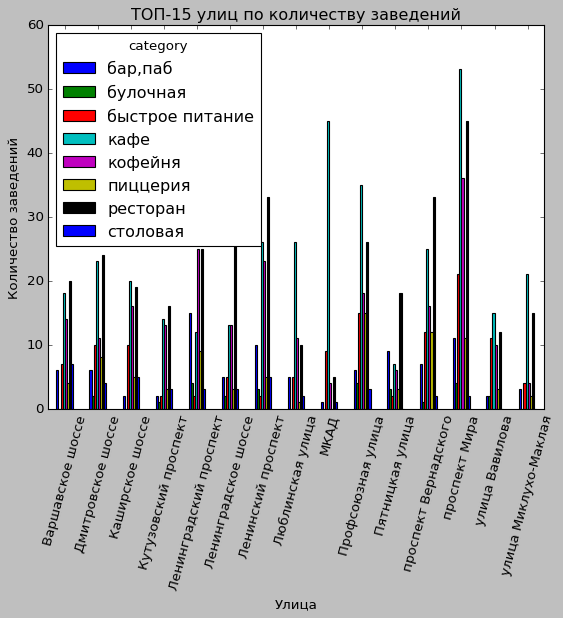

In [64]:
df_str.pivot_table(index='street', columns='category', values='name', aggfunc='count').plot.bar()
plt.title('ТОП-15 улиц по количеству заведений')
plt.xticks(rotation=75)
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.show()

Одна из самых популярных улиц (если оценивать по количеству заведений) - это проспект Мира. Также бросается в глаза, что на МКАД достаточно много кафе. Следует отметить, что много заведений расположено на длинных улицах (например, Дмитровское шоссе, Каширское шоссе), то есть чем длиннее улица, тем больше на ней заведений (что логично). Ещё следует отметить Пятницкую улицу, расположенную в самом центре: несмотря на то, что она не очень длинная относительно других, на ней большая концентрация заведений.

### Улицы, на которых расположен только 1 объект общепита

In [65]:
tail_str = df['street'].value_counts().loc[lambda x : x == 1].index
tail_str

Index(['улица Водников', 'Сытинский переулок', 'Коломенская набережная',
       'проспект Академика Сахарова', 'Пулковская улица', 'Красноярская улица',
       'улица Гашека', 'Малый Кисловский переулок',
       '3-й Новомихалковский проезд', 'площадь Журавлёва',
       ...
       'Каргопольская улица', 'парк Сад будущего', 'Воробьёвская набережная',
       'Старомонетный переулок', 'Старокаширское шоссе', 'Орловский переулок',
       'Денежный переулок', 'Мажоров переулок', 'Смоленская-Сенная площадь',
       'Курсовой переулок'],
      dtype='object', length=459)

Улиц, на которых расположен только 1 объет общепита, достаточно много.

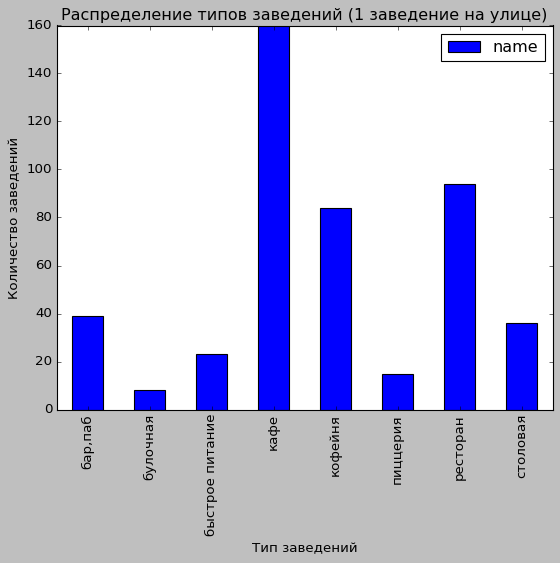

In [66]:
df_tail = df[df['street'].isin(tail_str)]
df_tail.pivot_table(index='category', values='name', aggfunc='count').plot.bar()
plt.title('Распределение типов заведений (1 заведение на улице)')
plt.xlabel('Тип заведений')
plt.ylabel('Количество заведений')
plt.show()

В основном, график повторяет распределение несетевых заведений по Москве: на первом месте с большим отрывом кафе, второе и третье места - рестораны и кофейни (правда, если смотреть несетевые заведения, разрыв между этими двумя категориями больше), на четвёртом месте бары. На последнем месте булочные. Следует отметить столовые: этот тип заведений на 5ом месте, если на улице только одно заведение, и на предпоследнем, если говорить о всех несетевых заведениях.

### Медиана среднего чека для каждого района

In [67]:
df_avg_bill = df.loc[df['middle_avg_bill'] > 0].groupby('district')['middle_avg_bill'].median()
df_avg_bill

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

In [68]:
state_geo = '/datasets/admin_level_geomap.geojson'
m_lat, m_lng = 55.751244, 37.618423
m3 = folium.Map(location=[m_lat, m_lng], zoom_start=10)
folium.Choropleth(
    geo_data = state_geo,
    data = df_avg_bill,
    columns = 'middle_avg_bill',
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний рейтинг заведений по районам'
).add_to(m3)

m3

Самые дорогие заведения (согласно, медианному значению среднего чека) находятся в ЦАО и ЗАО (что соответствуется нашим ожиданиям - самые дорогие заведения расположены именно в центре, запад считается престижным и дорогим районом, что сказывается на величине среднего чека). Самыве дешёвые заведения расположены в промышленных районах (СВАО, ЮВАО), а также на юге.

### Круглосуточные заведения

In [69]:
df.loc[df['is_24/7'] == True].pivot_table(index='category', columns='district', values='name', aggfunc='count')

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",1.0,5.0,4.0,4.0,NaN,29.0,5.0,NaN,4.0
булочная,6.0,NaN,5.0,4.0,3.0,1.0,1.0,1.0,3.0
быстрое питание,21.0,18.0,14.0,17.0,7.0,14.0,15.0,20.0,24.0
кафе,33.0,25.0,28.0,31.0,12.0,30.0,48.0,34.0,26.0
кофейня,5.0,9.0,5.0,3.0,2.0,26.0,1.0,7.0,1.0
пиццерия,8.0,2.0,2.0,3.0,1.0,2.0,9.0,NaN,4.0
ресторан,21.0,12.0,11.0,11.0,18.0,26.0,13.0,10.0,13.0
столовая,2.0,1.0,2.0,2.0,NaN,3.0,1.0,1.0,NaN


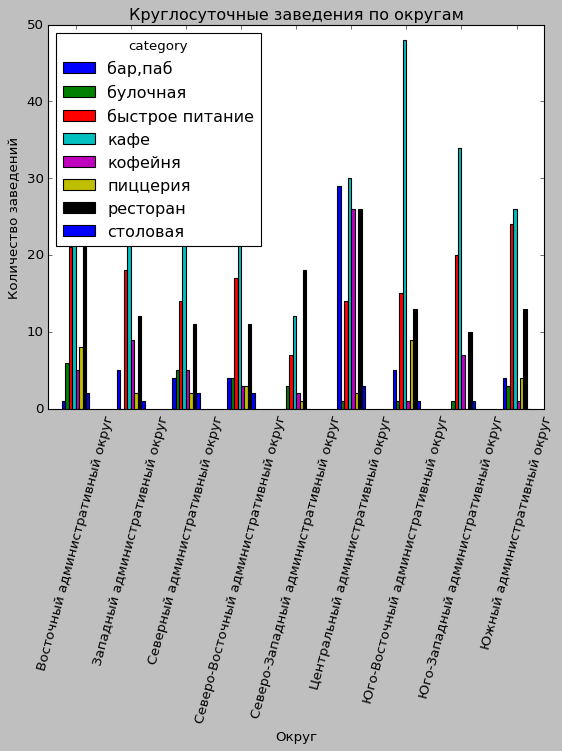

In [70]:
df.loc[df['is_24/7'] == True].pivot_table(index='district', columns='category', values='name', aggfunc='count').plot.bar()
plt.title('Круглосуточные заведения по округам')
plt.xticks(rotation=75)
plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.show()

Больше всего круглосуточных заведений в центральном административном округе (ведь это центр ночной жизни). Чаще всего круглосуточно работают кафе, на втором месте рестораны. В ЦАО много круглосуточных кофеен и баров (в отличие от других округов). Часто также круглосуточно работают заведения общественного питания. Реже всего круглосуточными являются столовые.

### Заведения с плохим рейтингом (не более 2)

In [71]:
df.loc[df['rating'] <=2]['name'].count()
#в наших данных 67 заведений с рейтингом не более 2

67

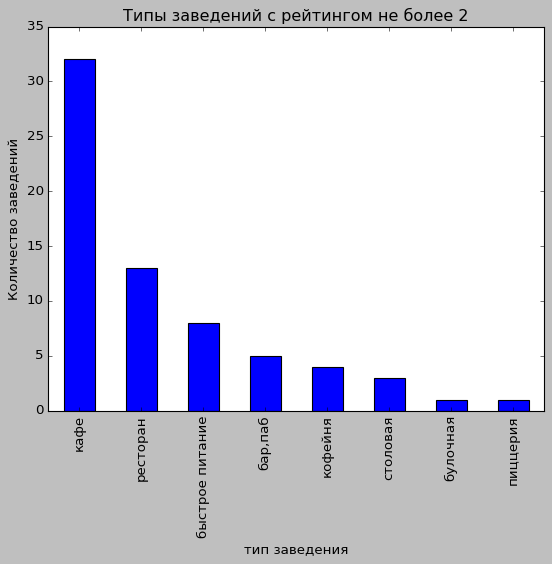

In [72]:
df.loc[df['rating'] <=2].groupby('category')['rating'].count().sort_values(ascending=False).plot.bar()
plt.title('Типы заведений с рейтингом не более 2')
plt.xlabel('тип заведения')
plt.ylabel('Количество заведений')
plt.show()

Распределение заведений с низким рейтингом во многом совпадает с распределением несетевых заведений: самый часто встречающийся тип - кафе, второй по популярности - ресторан. Реже всего встречаются булочные, столовые и пиццерии. Третье место среди заведений с низким рейтингом занимают рестораны быстрого питания (среди всех заведений - кофейни).

### Выводы

На основании проведённого выше анализа мы можем сделать следующие выводы:

- Среди заведений общественного питания больше всего распространены кафе, на втором месте рестораны, на третьем месте кофейни (1413 шт. или 16.8%). Конкуренция среди кофеен высокая.
- По медианному количеству посадочных мест лидируют рестораны, на втором месте бары, на третьем кофейни (80 мест в заведении).
- Сетевые заведения составляют примерно 38% от общего числа заведений. Соотношение сетевых и несетевых кофеен примерно 1:1.
- Среди Топ-15 сетевых заведений большинство составляют именно кофейни (336 шт).
- В ходе анализа были обнаружены следующие неточности в данных: заведения одной сети могут относиться к разным типам. Например, заведения "Му-Му" - это и кафе, и рестораны, и бары. Нужно обратить внимание инженеров данных на этот момент.
- Также нужно обратить внимание инженеров данных, что не для всех заведений корректно заполнена информация о том, является ли заведение сетевым или нет.
- Не для всех заведений заполнен уровень цен, хотя информармация по среднему чеку или цене чашки капучино есть. Также нужно обратить внимание инженеров данных на это.
- Больше всего заведений расположены в ЦАО. Кофеен также больше всего в центре.
- Что касается среднего рейтинга в засисимости от категории, то разброс получается небольшим (от 4 до 4.4). Самый высокий средний рейтинг заведений в СВАО, самый низкий в ВАО.
- Почти все улицы из Топ-15 по количеству заведений - это длинные проспекты и шоссе.
- Если анализиировать улицы, на которых расположено всего одно заведение, то распределение заведений по типу будет примерно таким же, как распределение несетевых заведений.
- Самый высокий медианный средний чек в ЗАО и ЦАО, самый низкий в СВАО, ЮВАО, ЮАО.
- Круглосуточно чаще всего работают кафе и заведения в центре.
- Чаще всего низкий рейтинг (не более 2) оказывается у кафе, ресторанов, заведений быстрого питания.

## Открытие кофейни

В соответствии с заказом фонда «...» проанализируем открытие новой кофейни в Москве (какой формат будет наиболее выигрышным). Концепт заведения: интересная и доступная кофейня (аналогичная «Central Perk» из сериала "Друзья").

Ранее мы уже выяснили, что в Москве 1413 кофеен или 16.8% всех заведений Москвы (то есть конкуренция достаточно серьёзная).

In [73]:
#оставляем в данных только кофейни
df_c = df.loc[df['category'] == 'кофейня']
df_c.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,name_1,address_1,ch
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1,улица Маршала Федоренко,False,dormouse coffee shop,"москва, улица маршала федоренко, 12",несетевое
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,неизвестно,неизвестно,-1.0,-1.0,1,-1,парк Левобережный,False,в парке вкуснее,"москва, парк левобережный",сетевое
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,неизвестно,неизвестно,-1.0,-1.0,1,46,Коровинское шоссе,False,9 bar coffee,"москва, коровинское шоссе, 41, стр. 1",сетевое
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,неизвестно,неизвестно,-1.0,-1.0,1,-1,улица Маршала Федоренко,False,cofefest,"москва, улица маршала федоренко, 6с1",сетевое
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,неизвестно,неизвестно,-1.0,-1.0,1,-1,улица Дыбенко,False,cofix,"москва, улица дыбенко, 7/1",сетевое
53,Royal Coffee,кофейня,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880622,37.448529,3.1,неизвестно,неизвестно,-1.0,-1.0,0,148,Правобережная улица,False,royal coffee,"москва, правобережная улица, 1б",несетевое
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,-1.0,1,-1,Угличская улица,False,coffeekaldi's,"москва, угличская улица, 13, стр. 8",сетевое
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,неизвестно,неизвестно,-1.0,-1.0,1,-1,ландшафтный заказник Лианозовский,False,чебуречная история,"москва, ландшафтный заказник лианозовский",сетевое
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,неизвестно,неизвестно,-1.0,-1.0,0,-1,Лианозовский парк культуры и отдыха,False,testo мания,"москва, лианозовский парк культуры и отдыха",несетевое
66,Молинари,кофейня,"Москва, Алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.887887,37.588294,4.8,неизвестно,неизвестно,-1.0,-1.0,0,120,Алтуфьевское шоссе,False,молинари,"москва, алтуфьевское шоссе, 70, корп. 1",несетевое


In [74]:
df_c.groupby('district')['name'].count()

district
Восточный административный округ           105
Западный административный округ            150
Северный административный округ            193
Северо-Восточный административный округ    159
Северо-Западный административный округ      62
Центральный административный округ         428
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Южный административный округ               131
Name: name, dtype: int64

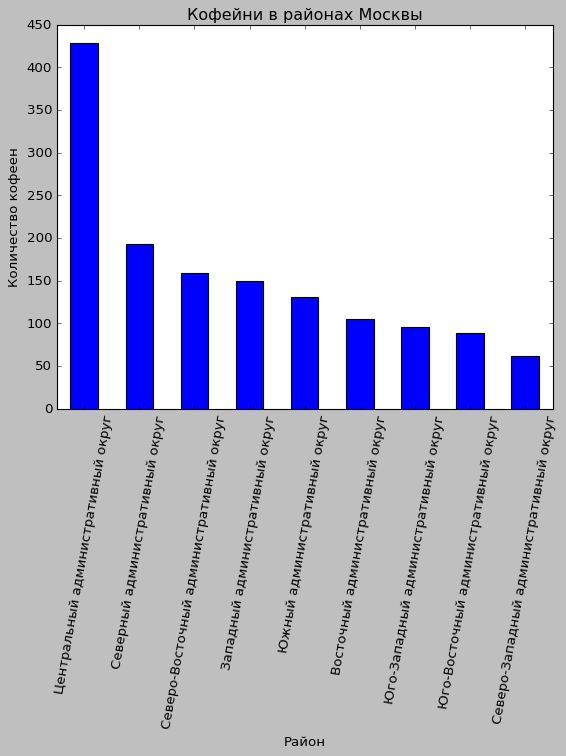

In [75]:
df_c.groupby('district')['name'].count().sort_values(ascending=False).plot.bar()
plt.title('Кофейни в районах Москвы')
plt.xticks(rotation=80)
plt.xlabel('Район')
plt.ylabel('Количество кофеен')
plt.show()

Как говорили ранее, больше всего кофеен в центре, меньше всего в СЗАО (где плотность населения самая низкая).

Посмотрим, много ли кроглосуточных кофеен.

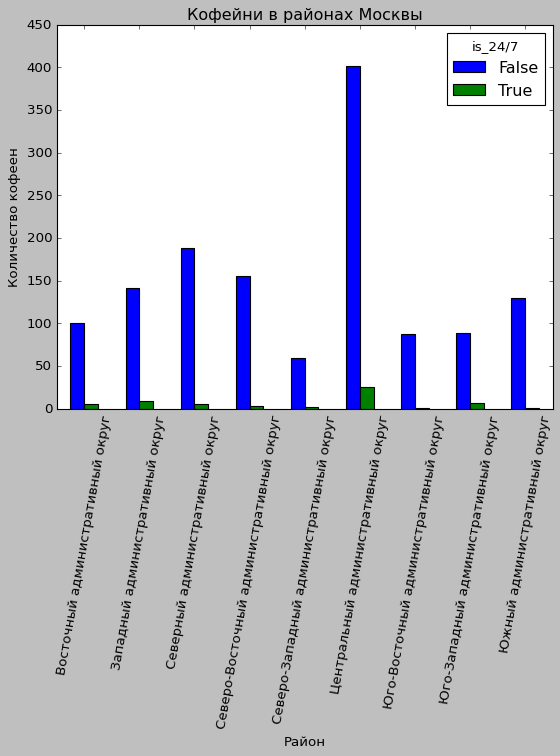

In [76]:
df_c.pivot_table(index='district', columns='is_24/7', values='name', aggfunc='count').plot.bar()
plt.title('Кофейни в районах Москвы')
plt.xticks(rotation=80)
plt.xlabel('Район')
plt.ylabel('Количество кофеен')
plt.show()

Большинство кофеен не являются кроглосуточными. Больше всего круглосуточных кофеен расположено в центре.

Посмотрим распределение рейтингов кофеен по району.

In [77]:
df_с_rating = df_c.groupby('district')['rating'].mean()
df_с_rating

district
Восточный административный округ           4.282857
Западный административный округ            4.195333
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Центральный административный округ         4.336449
Юго-Восточный административный округ       4.225843
Юго-Западный административный округ        4.283333
Южный административный округ               4.232824
Name: rating, dtype: float64

In [78]:
state_geo = '/datasets/admin_level_geomap.geojson'
m_lat, m_lng = 55.751244, 37.618423
m4 = folium.Map(location=[m_lat, m_lng], zoom_start=10)
folium.Choropleth(
    geo_data = state_geo,
    data = df_с_rating,
    columns = ['rating'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний рейтинг кофеен по районам'
).add_to(m4)

m4

Самый высокий рейтинг у кофеен в центре и на северо-западе, самый низкий рейтинг на западе и на севео-востоке. Однако следует подчеркнуть, что средний рейтинг по районам для кофеен колеблится в диапозоне от 4.2 до 4.34 (это ещё раз подчёркивает, насколько высокая конкуренция среди кофеен).

Посмотрим среднюю цену чашки капучино по районам.

In [79]:
df_c_bill = df_c.loc[df['middle_coffee_cup'] > 0].groupby('district')['middle_coffee_cup'].median()
df_c_bill

district
Восточный административный округ           135.0
Западный административный округ            189.0
Северный административный округ            159.0
Северо-Восточный административный округ    162.5
Северо-Западный административный округ     165.0
Центральный административный округ         190.0
Юго-Восточный административный округ       147.5
Юго-Западный административный округ        198.0
Южный административный округ               150.0
Name: middle_coffee_cup, dtype: float64

In [80]:
state_geo = '/datasets/admin_level_geomap.geojson'
m_lat, m_lng = 55.751244, 37.618423
m5 = folium.Map(location=[m_lat, m_lng], zoom_start=10)
folium.Choropleth(
    geo_data = state_geo,
    data = df_c_bill,
    columns = 'middle_coffee_cup',
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.8,
    legend_name = 'Средний рейтинг заведений по районам'
).add_to(m5)

m5

In [81]:
#посмотрим расположение кофеен на карте
m6 = folium.Map(location=[m_lat, m_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m6)
df_c.apply(create_clusters, axis=1)
m6

На основании изложенной выше информации можно дать следующую рекоменадцию заказчику из «...».

- Конкуренция на рынке кофеен в Москве высокая. Конкурировать с сетевыми кофейнями бессмысленно, они уже хорошо известны публике. Чтобы конкурировать с несетевыми кофейнями, необходимо продумать концепт заведения (вариант уютная и доступная кофейня, аналогичная «Central Perk» из сериала "Друзья").
- Для большего охвата следует рассмотреть центральные районы Москвы для открытия кофеен. Безусловно, конкуренция в других районах ниже, но мало кто специально поедет в кофейню, расположенную не в центре.
- Среди кофеен мало круглосуточных, работа 24/7 стала бы существенным конкурентным преимуществом.
- Чтобы круглосуточная кофейня окупалась, она должна находиться в местах, где большой человеческий поток (например, в крупных пересадочных узлах или в раойне вокзала). Как вариант, кофейня может разместиться недалеко от вокзала, чтобы людям с большими сумками было удобно до неё дойти и скоротать там время в ожидании поезда. Если при этом кофейня будет недалеко от станции метро, она будет интересна людям, которые едут в офис.
- Ценовая политика и ассортимент: кофейня не должна быть дешёвой (чтобы продукты в ней были качественными) и слишком дорогой (чтобы не отпугнуть потенциальных клиентов). Можно определить уровень цен на основе медианного уровня цен в округе. Также желательно, чтобы кофейня предлагала не только кофе, но и еду (завтраки для тех, кто едет в офис, перекус для тех, кто ждёт поезд).
- Места в кофейне должно быть достаточно, чтобы в ней могли разместиться люди с сумками.

## Общий вывод

В рамках исследования были проанализированы данные заведений общественного питания города Москвы, по возможности были устранены проблемы в данных (в частности пропуски). Всего в данных содержится информация об 8406 заведениях общественного питания.

Был проанализированы данные по заведениям, в частности по кофейням. Доля кофеен составляет около 16.8%, много кофеен расположены в центре города, соотношение сетевых и несетевых кофеен примерно 1:1, круглосуточных кофеен мало. В целом рынок кофеен является высококонкурентным.

Заказчику из фонда «Shut Up and Take My Money» была дана рекомендация по поводу открытия кофейни. Кофейня должна быть оригинальной (не сетевой), желательно, чтобы она была расположена недалеко от вокзала и станции метро, чтобы она работала круглосуточно. Цены в кофейне должны соответствовать медианному уровню цен в Центральном административном округе.

Презентация: https://docs.google.com/presentation/d/1RTpZaN-7BT9c4TOBYa7CFhaHM2ckFyF58I2L-JczTtI/edit?usp=sharing